```python
file1 \_ |-----------------------------------|   -+-
file2 \_ |-----------------------------------|    |   training data
file3 \_ |-----------------------------------|    |        80%
file4 \_ |-----------------------------------|    |
                                                 -+-
file5 \_ |-----------------------------------|    |  validation data
file6 \_ |-----------------------------------|    |        20%
         |-----------------------------------|   -+-
```

In [1]:
import os
import glob

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

from utils.MovingAverager import *

# 讀檔

In [2]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time

def gen_total_mag(df: pd.DataFrame):
    
    df['mag_x'] = moving_average(df['mag_x'], 41)
    df['mag_y'] = moving_average(df['mag_y'], 41)
    df['mag_z'] = moving_average(df['mag_z'], 41)
    
    df['mag_t'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2) + (df['mag_z'] ** 2))
    
    return df

def load_original_data(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = total_df[:-5]  # remove last None value row
    total_df = rename_data(total_df)
    total_df = gen_total_mag(total_df)
    
    return total_df

In [3]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
        
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, chunk_size=5, seq_len=25):
    length = chunk_size * seq_len
    num_of_segs = int(np.floor(len(df) / length))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * length):int((i + 1) * length)].to_numpy()
        segments.append(np.array(np.split(seg, chunk_size)))
        
    return segments

def split_segments_overlap(df, chunk_size=5, seq_len=25):
    num_of_chunk = int(np.floor(len(df) / seq_len))
    
    segments = []
    for i in range(num_of_chunk - chunk_size):
        seg = df.iloc[int(i * seq_len):int((i + chunk_size) * seq_len)].to_numpy()
        segments.append(np.array(np.split(seg, chunk_size)))
        
    return segments

# def split_segments_overlap(df, chunk_size=5, seq_len=25):
#     total_length = chunk_size * seq_len
    
#     segments = []
#     for i in range(0, len(df) - total_length, 5):
#         seg = df.iloc[i:i + total_length].to_numpy()
#         segments.append(np.array(np.split(seg, chunk_size)))
        
#     return segments


def select_data(df):
    return df[['lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'mag_x', 'mag_y', 'mag_z', 'mag_t', 'system_time']]


def preprocess_data(df, chunk_size=5, seq_len=25, is_train_data=False):
    pre_df = select_data(df)
    
    if is_train_data:
        segs = split_segments_overlap(pre_df, chunk_size, seq_len)
    else:
        segs = split_segments(pre_df, chunk_size, seq_len)
    
    return segs

In [4]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

#         print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num, file_index=None, is_train_data=False):
    prefix = 'train' if is_train_data else 'valid'
    pair_data = []
    folder_paths = glob.glob(f'*{os.path.normpath(root_folder)}/*')

    if file_index is not None:
        folder_paths = folder_paths[file_index[0]:file_index[1]]

    for i, folder_path in enumerate(folder_paths):
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        print(f'{prefix} {i + 1: >3}: {folder_path}')
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path)
        target_df = load_original_data(target_path)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = align_data(source_df, target_df)
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        
#         print(source_df.system_time[0], target_df.system_time[0])
#         print(source_df.system_time[len(source_df) - 1], target_df.system_time[len(target_df) - 1])
#         print(len(source_df), len(target_df))
        
#         plt.figure(figsize=(30, 5))
#         plt.plot(np.arange(len(source_df)), source_df.acc_x)
#         plt.plot(np.arange(len(target_df)), target_df.acc_y)
#         plt.show()
        
        source_segs = preprocess_data(source_df, chunk_size, seq_len, is_train_data)
        target_segs = preprocess_data(target_df, chunk_size, seq_len, is_train_data)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
        
    return pair_data

In [5]:
datapoint_per_second = 20
duration = 2
chunk_size = 7
seq_len = 25
classes = {0: 'target', 1: 'front_pocket', 2: 'pocket', 3: 'swing'}

In [6]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [7]:
train_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[0, 8], is_train_data=True)
valid_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[8, 10], is_train_data=False)

train_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[0, 8], is_train_data=True)
valid_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[8, 10], is_train_data=False)

train_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[0, 8], is_train_data=True)
valid_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[8, 10], is_train_data=False)

train   1: front_pocket/202302071628
train   2: front_pocket/202302071652
train   3: front_pocket/202302071523
train   4: front_pocket/202302071531
train   5: front_pocket/202302071715
train   6: front_pocket/202302071641
train   7: front_pocket/202302071541
train   8: front_pocket/202302071619
valid   1: front_pocket/202302071704
valid   2: front_pocket/202302071724
train   1: pocket/202302132108
train   2: pocket/202302131750
train   3: pocket/202302131601
train   4: pocket/202302071606
train   5: pocket/202302132053
train   6: pocket/202302122132
train   7: pocket/202302132116
train   8: pocket/202302131643
valid   1: pocket/202301101952
valid   2: pocket/202302132101
train   1: swing/202302142339
train   2: swing/202302132131
train   3: swing/202302142117
train   4: swing/202302132124
train   5: swing/202302121947
train   6: swing/202302121857
train   7: swing/202302142128
train   8: swing/202302121920
valid   1: swing/202302121909
valid   2: swing/202302142331


In [8]:
print(len(train_front_pocket_pair_data), len(train_pocket_pair_data), len(train_swing_pair_data))

1788 1748 1684


In [9]:
train_front_pocket_pair_data[0][0][0, -1], train_front_pocket_pair_data[0][2][0, -1]

(array([ 4.08018416e-01, -1.88228362e+00, -2.25128342e+00, -5.40463984e-01,
        -1.87591553e+00,  5.90145647e-01,  1.60005878e+01, -1.49559553e+01,
         3.60812065e+01,  4.22084455e+01,  1.67575812e+09]),
 array([ 3.23165961e-01,  9.69002332e-01,  1.22304923e+00,  2.38888234e-01,
        -1.13709919e-01,  3.30951400e-02, -3.67468223e+01, -2.82494801e-01,
        -2.19929452e+01,  4.28263749e+01,  1.67575811e+09]))

# 建立dataloader

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [11]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [12]:
class FirstDerivativeLoss(nn.Module):
    def __init__(self, weight=None, size_average=None, reduce=None, reduction='mean', chunk_size=5):
        super(FirstDerivativeLoss, self).__init__()
        self.chunk_size = chunk_size

    def forward(self, source, target):
        # calculate the first derivative
        source_o = torch.reshape(source, (len(source), self.chunk_size, -1))
        target_o = torch.reshape(target, (len(target), self.chunk_size, -1))
        d_source = source_o[1:] - source_o[:-1]
        d_target = target_o[1:] - target_o[:-1]
        deriv = d_source - d_target

        # calculate the loss as the mean squared error of the derivative
        loss = torch.mean(torch.pow(deriv, 2))

        return loss

In [13]:
def generator_loss(z_imu, target_imu, predict_mag, target_mag, source_total_mag, target_total_mag):
    imu_loss = mse_loss(z_imu, target_imu)
    mag_loss = mse_loss(predict_mag, target_mag)
    d1_loss = div_loss(predict_mag, target_mag)
    
    pred_total_mag = torch.sqrt(torch.sum(torch.pow(predict_mag, 2), dim=-1))
    
    smag_limitation_loss = torch.mean(torch.abs(pred_total_mag - source_total_mag))
    tmag_limitation_loss = torch.mean(torch.abs(pred_total_mag - target_total_mag))

    total_loss = imu_loss + mag_loss + d1_loss + smag_limitation_loss * 0.2 + tmag_limitation_loss
    
    return total_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss)

# def discriminator_loss(d_real, d_fake):
#     real_loss = bce_loss(d_real, torch.ones_like(d_real))
#     fake_loss = bce_loss(d_fake, torch.zeros_like(d_fake))

#     return real_loss + fake_loss

In [14]:
train_data = train_front_pocket_pair_data + train_pocket_pair_data + train_swing_pair_data
valid_data = valid_front_pocket_pair_data + valid_pocket_pair_data + valid_swing_pair_data

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=512)

In [15]:
batch = next(iter(train_loader))

In [16]:
EPOCH = 2000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()
bce_loss = torch.nn.BCELoss()
div_loss = FirstDerivativeLoss(chunk_size=chunk_size)

In [17]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [18]:
class Classifier(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(Classifier, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.cnn = nn.Sequential(
            nn.Conv1d(6, 16, kernel_size=5),
            nn.LeakyReLU(),
            nn.Conv1d(16, 16, kernel_size=5),
            nn.LeakyReLU(),
        )
        
        # 16 * (seq_len-8)
        self.rnn = nn.RNN(input_size=16 * (seq_len - 8), hidden_size=64, num_layers=2, batch_first=True)
        
        self.last = nn.Sequential(
            nn.Linear(64, 16),
            nn.Tanh(),
            nn.Linear(16, num_of_classes),
            nn.Softmax(dim=2),
        )
        
    def forward(self, x):  # input: (bs, chunk_size, seq_len, 9)
        h = torch.reshape(x, (len(x) * self.chunk_size, self.seq_len, -1))  # (bs, chunk_size, seq_len, 9) -> (bs * chunk_size, seq_len, 9)
        h = torch.permute(h, (0, 2, 1))  # (bs * chunk_size, seq_len, 9) -> (bs * chunk_size, 9, seq_len) [CNN要對最後一個維度做卷積]
        
        h = self.cnn(h)

        h = torch.permute(h, (0, 2, 1))
        h = torch.reshape(h, (len(x), self.chunk_size, -1))
        
        hz, _ = self.rnn(h)
        out = self.last(hz)

        out = torch.reshape(out, (len(x), self.chunk_size, self.num_of_classes))
        
        return out, hz
    

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    

class NotSimpleTransformer(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.imu_layer = nn.Sequential(
            nn.Linear(6, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 64),
            nn.LeakyReLU(),
        )
        self.mag_layer = nn.Sequential(
            nn.Linear(3, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 64),
            nn.LeakyReLU(),
        )
        self.pos_encoder = PositionalEncoding(64 * self.seq_len, 0.1)
        
        self.encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        self.nn = nn.Sequential(
            nn.Linear(64, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 6),
            nn.LeakyReLU(),
        )
        
        self.decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64* self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        
        self.mag_last = nn.Sequential(
            nn.Linear(64, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 3),
        )
        
    def forward(self, source_imu, source_mag):
        
        ### step 1
        h_imu = self.imu_layer(source_imu)
        h_imu = h_imu.reshape((len(source_imu), self.chunk_size, -1))
        h_imu = self.pos_encoder(h_imu)
        
        h_mag = self.mag_layer(source_mag)
        h_mag = h_mag.reshape((len(source_mag), self.chunk_size, -1))
        h_mag = self.pos_encoder(h_mag)
        
        ### step 2
        z = self.encoder(h_imu)
        z_imu = z.reshape((len(source_imu), self.chunk_size, self.seq_len, -1))
        z_imu = self.nn(z_imu)
        
        ### step 3
        pred_latent = self.decoder(h_mag, z)
        pred_mag = pred_latent.reshape((len(source_mag), self.chunk_size, self.seq_len, -1))
        pred_mag = self.mag_last(pred_mag)
        
        
        return z_imu, pred_mag
        

In [19]:
model = NotSimpleTransformer(chunk_size=chunk_size, seq_len=seq_len, num_of_classes=num_of_classes).to(device)
# discriminator = Discriminator(chunk_size=chunk_size, seq_len=seq_len).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)
# optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.000025)

In [20]:
from torchinfo import summary
summary(model, input_size=[(1, 7, 25, 6), (1, 7, 25, 3)])

Layer (type:depth-idx)                        Output Shape              Param #
NotSimpleTransformer                          [1, 7, 25, 6]             --
├─Sequential: 1-1                             [1, 7, 25, 64]            --
│    └─Linear: 2-1                            [1, 7, 25, 32]            224
│    └─LeakyReLU: 2-2                         [1, 7, 25, 32]            --
│    └─Linear: 2-3                            [1, 7, 25, 64]            2,112
│    └─LeakyReLU: 2-4                         [1, 7, 25, 64]            --
├─PositionalEncoding: 1-2                     [1, 7, 1600]              --
│    └─Dropout: 2-5                           [1, 7, 1600]              --
├─Sequential: 1-3                             [1, 7, 25, 64]            --
│    └─Linear: 2-6                            [1, 7, 25, 16]            64
│    └─LeakyReLU: 2-7                         [1, 7, 25, 16]            --
│    └─Linear: 2-8                            [1, 7, 25, 64]            1,088
│    └─LeakyR

In [29]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
        
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [22]:
def train(dataloader, draw=False):
    model.train()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    lim_loss = []

    for source_data, source_label, target_data, target_label in dataloader:
        optimizer.zero_grad()

        source_data = source_data.to(device)
        source_imu = source_data[:, :, :, :6]
        source_mag = source_data[:, :, :, 6:9]
        source_total_mag = source_data[:, :, :, 9]
        
        target_data = target_data.to(device)
        target_imu = target_data[:, :, :, :6]
        target_mag = target_data[:, :, :, 6:9]
        target_total_mag = target_data[:, :, :, 9]

        # generate mag
        z_imu, predict_mag = model(source_imu, source_mag)
        
        # generator loss
        gen_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag, source_total_mag, target_total_mag)
        
        # backward
        gen_loss.backward()
        optimizer.step()
        
        # record loss
        g_losses.append(gen_loss.item())
        imu_losses.append(imu_loss.item())
        mag_losses.append(mag_loss.item())
        d1_losses.append(d1_loss.item())
        lim_loss.append([smag_limitation_loss.item(), tmag_limitation_loss.item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)

    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses), np.mean(d1_losses), np.mean(lim_loss, axis=0)

In [23]:
def evalute(dataloader, draw=False):
    model.eval()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    lim_loss = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :, :6]
            source_mag = source_data[:, :, :, 6:9]
            source_total_mag = source_data[:, :, :, 9]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :, :6]
            target_mag = target_data[:, :, :, 6:9]
            target_total_mag = target_data[:, :, :, 9]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # generator loss
            gen_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag,
                                                                                                  source_total_mag, target_total_mag)

            # record loss
            g_losses.append(gen_loss.item())
            imu_losses.append(imu_loss.item())
            mag_losses.append(mag_loss.item())
            d1_losses.append(d1_loss.item())
            lim_loss.append([smag_limitation_loss.item(), tmag_limitation_loss.item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses), np.mean(d1_losses), np.mean(lim_loss, axis=0)

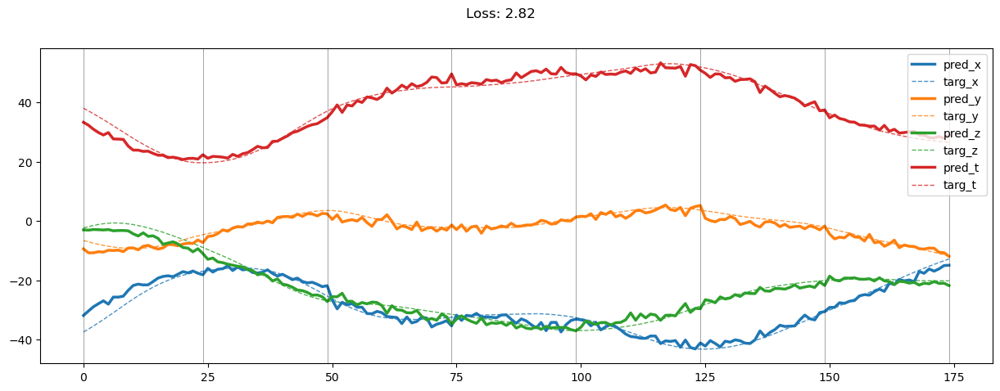

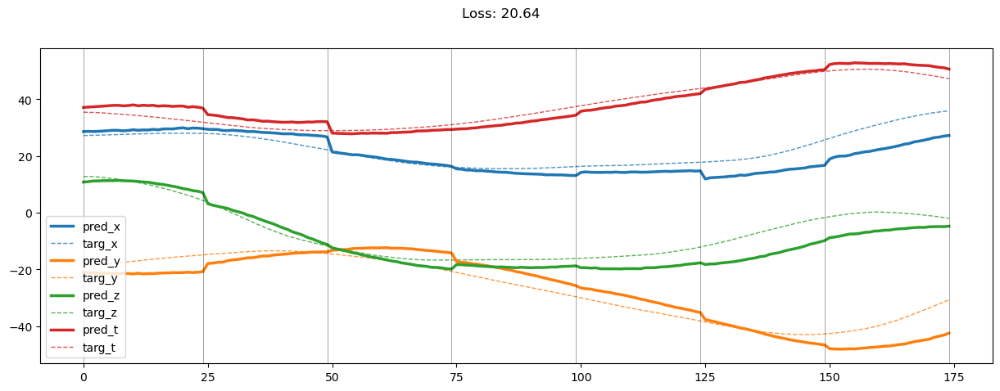

00020: train loss:  9.052, imu loss:  0.667, mag loss:  2.122, div loss:  4.225, slim:  4.391, tlim:  1.160
       valid loss:  129.200, imu loss:  0.511, mag loss:  53.672, div loss:  69.220, slim:  5.173, tlim:  4.763
00040: train loss:  8.999, imu loss:  0.667, mag loss:  2.107, div loss:  4.182, slim:  4.388, tlim:  1.166
       valid loss:  129.739, imu loss:  0.511, mag loss:  54.319, div loss:  69.085, slim:  5.235, tlim:  4.778
00060: train loss:  8.947, imu loss:  0.666, mag loss:  2.091, div loss:  4.166, slim:  4.376, tlim:  1.149
       valid loss:  128.030, imu loss:  0.511, mag loss:  52.757, div loss:  68.818, slim:  5.330, tlim:  4.878
00080: train loss:  8.925, imu loss:  0.668, mag loss:  2.081, div loss:  4.140, slim:  4.404, tlim:  1.155
       valid loss:  128.855, imu loss:  0.511, mag loss:  53.735, div loss:  68.709, slim:  5.224, tlim:  4.855
00100: train loss:  8.864, imu loss:  0.669, mag loss:  2.064, div loss:  4.109, slim:  4.391, tlim:  1.144
       valid

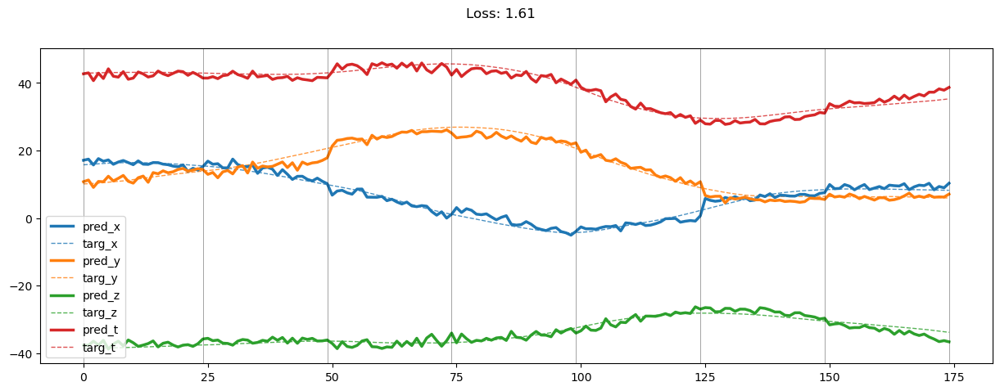

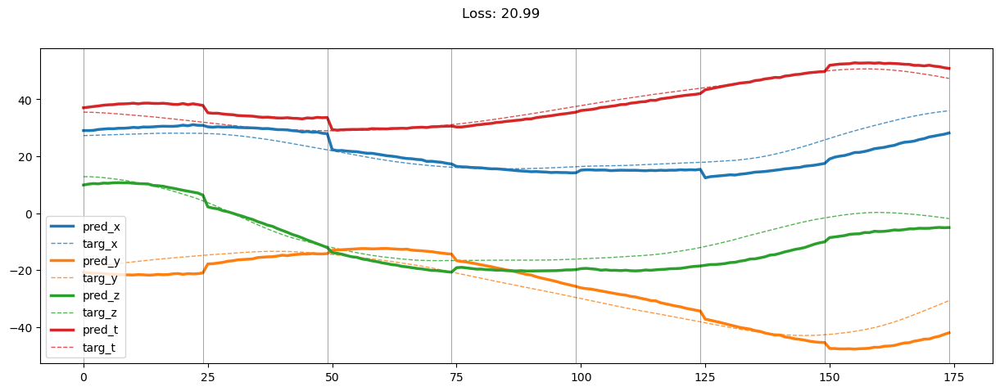

00200: train loss:  8.584, imu loss:  0.670, mag loss:  1.978, div loss:  3.934, slim:  4.402, tlim:  1.121
       valid loss:  131.997, imu loss:  0.512, mag loss:  54.502, div loss:  71.014, slim:  5.331, tlim:  4.903
00220: train loss:  8.497, imu loss:  0.665, mag loss:  1.958, div loss:  3.885, slim:  4.412, tlim:  1.107
       valid loss:  136.654, imu loss:  0.512, mag loss:  56.898, div loss:  73.286, slim:  5.346, tlim:  4.888
00240: train loss:  8.378, imu loss:  0.667, mag loss:  1.920, div loss:  3.814, slim:  4.374, tlim:  1.102
       valid loss:  131.266, imu loss:  0.512, mag loss:  55.215, div loss:  69.618, slim:  5.285, tlim:  4.864
00260: train loss:  8.407, imu loss:  0.666, mag loss:  1.927, div loss:  3.838, slim:  4.379, tlim:  1.101
       valid loss:  135.984, imu loss:  0.512, mag loss:  56.825, div loss:  72.648, slim:  5.364, tlim:  4.927
00280: train loss:  8.335, imu loss:  0.664, mag loss:  1.903, div loss:  3.797, slim:  4.371, tlim:  1.097
       valid

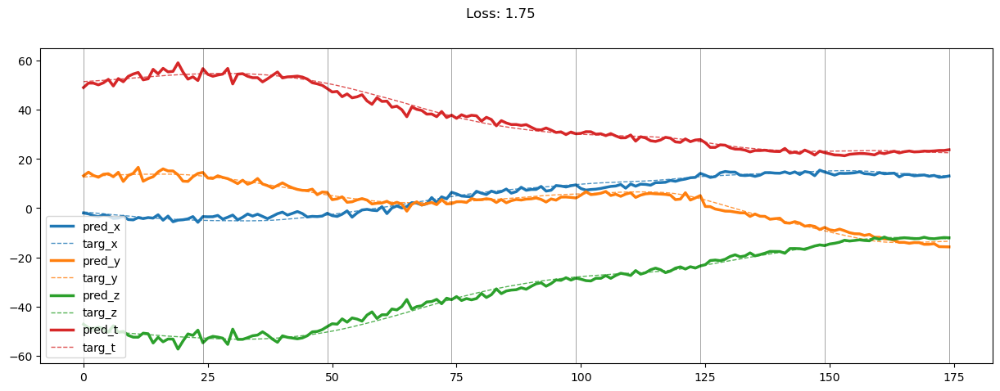

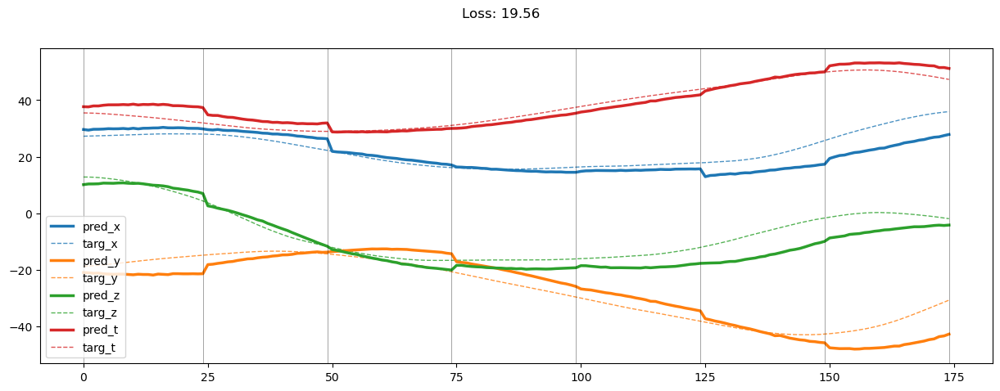

00400: train loss:  8.032, imu loss:  0.668, mag loss:  1.816, div loss:  3.611, slim:  4.363, tlim:  1.064
       valid loss:  130.634, imu loss:  0.512, mag loss:  53.960, div loss:  70.187, slim:  5.358, tlim:  4.903
00420: train loss:  8.012, imu loss:  0.668, mag loss:  1.803, div loss:  3.604, slim:  4.385, tlim:  1.061
       valid loss:  135.582, imu loss:  0.512, mag loss:  55.611, div loss:  73.400, slim:  5.426, tlim:  4.974
00440: train loss:  7.907, imu loss:  0.669, mag loss:  1.776, div loss:  3.539, slim:  4.350, tlim:  1.052
       valid loss:  133.366, imu loss:  0.512, mag loss:  54.670, div loss:  72.188, slim:  5.377, tlim:  4.921
00460: train loss:  7.976, imu loss:  0.667, mag loss:  1.793, div loss:  3.583, slim:  4.381, tlim:  1.057
       valid loss:  133.913, imu loss:  0.512, mag loss:  54.200, div loss:  73.112, slim:  5.473, tlim:  4.994
00480: train loss:  7.818, imu loss:  0.669, mag loss:  1.751, div loss:  3.474, slim:  4.389, tlim:  1.047
       valid

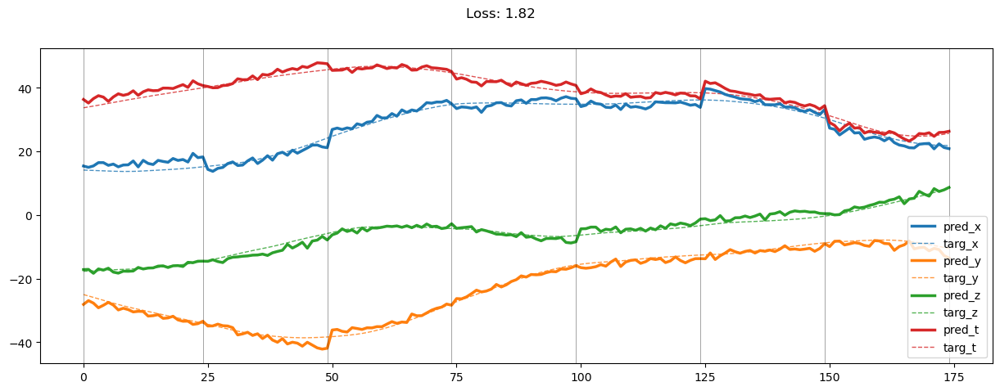

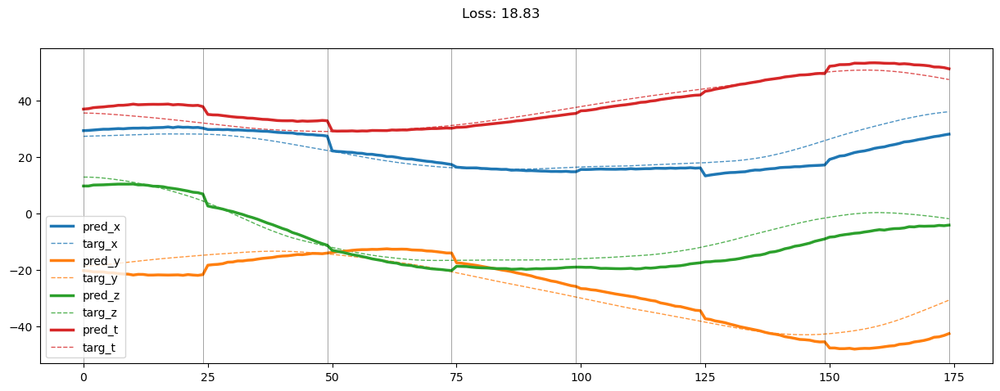

00600: train loss:  7.648, imu loss:  0.663, mag loss:  1.699, div loss:  3.381, slim:  4.399, tlim:  1.026
       valid loss:  135.060, imu loss:  0.513, mag loss:  55.296, div loss:  73.168, slim:  5.430, tlim:  4.997
00620: train loss:  7.611, imu loss:  0.663, mag loss:  1.688, div loss:  3.366, slim:  4.375, tlim:  1.019
       valid loss:  136.231, imu loss:  0.513, mag loss:  56.013, div loss:  73.673, slim:  5.419, tlim:  4.947
00640: train loss:  7.558, imu loss:  0.661, mag loss:  1.674, div loss:  3.332, slim:  4.370, tlim:  1.018
       valid loss:  137.275, imu loss:  0.513, mag loss:  56.535, div loss:  74.144, slim:  5.469, tlim:  4.989
00660: train loss:  7.562, imu loss:  0.660, mag loss:  1.671, div loss:  3.341, slim:  4.353, tlim:  1.019
       valid loss:  139.773, imu loss:  0.514, mag loss:  58.088, div loss:  75.085, slim:  5.507, tlim:  4.985
00680: train loss:  7.548, imu loss:  0.662, mag loss:  1.665, div loss:  3.328, slim:  4.390, tlim:  1.015
       valid

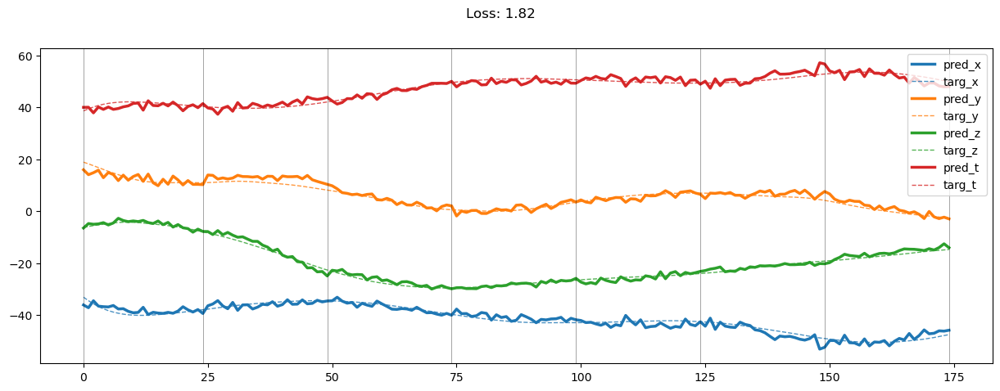

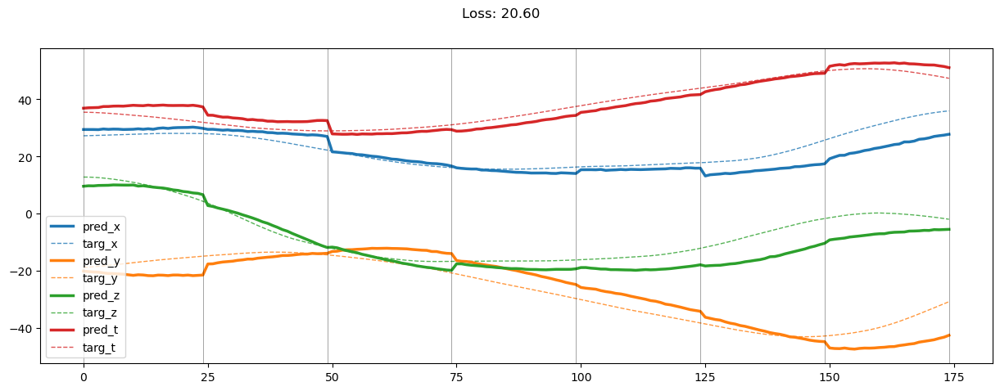

00800: train loss:  7.217, imu loss:  0.653, mag loss:  1.571, div loss:  3.142, slim:  4.322, tlim:  0.986
       valid loss:  138.662, imu loss:  0.515, mag loss:  57.020, div loss:  74.918, slim:  5.547, tlim:  5.100
00820: train loss:  7.271, imu loss:  0.656, mag loss:  1.587, div loss:  3.166, slim:  4.342, tlim:  0.994
       valid loss:  137.516, imu loss:  0.515, mag loss:  56.833, div loss:  74.033, slim:  5.514, tlim:  5.032
00840: train loss:  7.206, imu loss:  0.658, mag loss:  1.564, div loss:  3.123, slim:  4.390, tlim:  0.983
       valid loss:  138.524, imu loss:  0.515, mag loss:  57.568, div loss:  74.298, slim:  5.534, tlim:  5.035
00860: train loss:  7.160, imu loss:  0.653, mag loss:  1.553, div loss:  3.101, slim:  4.374, tlim:  0.979
       valid loss:  137.436, imu loss:  0.516, mag loss:  57.432, div loss:  73.329, slim:  5.504, tlim:  5.058
00880: train loss:  7.174, imu loss:  0.656, mag loss:  1.558, div loss:  3.106, slim:  4.375, tlim:  0.979
       valid

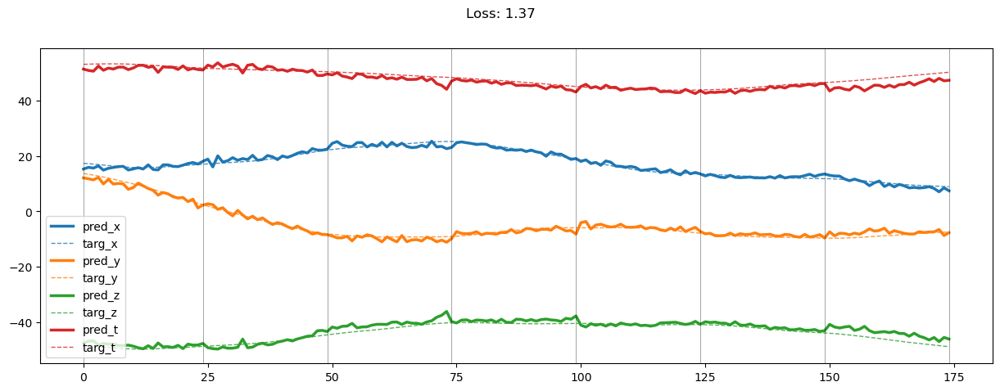

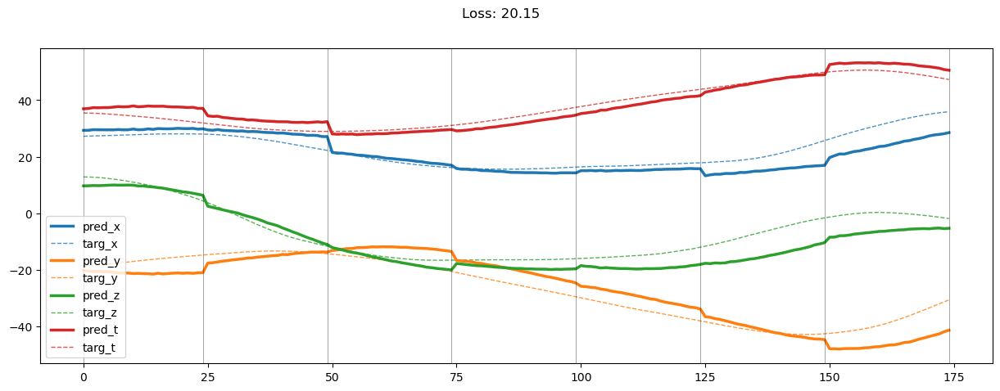

01000: train loss:  6.952, imu loss:  0.652, mag loss:  1.493, div loss:  2.979, slim:  4.341, tlim:  0.959
       valid loss:  140.735, imu loss:  0.517, mag loss:  58.113, div loss:  75.920, slim:  5.516, tlim:  5.082
01020: train loss:  6.929, imu loss:  0.654, mag loss:  1.490, div loss:  2.955, slim:  4.374, tlim:  0.955
       valid loss:  141.164, imu loss:  0.517, mag loss:  58.244, div loss:  76.128, slim:  5.589, tlim:  5.156
01040: train loss:  6.971, imu loss:  0.652, mag loss:  1.496, div loss:  2.989, slim:  4.377, tlim:  0.958
       valid loss:  141.178, imu loss:  0.517, mag loss:  58.507, div loss:  75.869, slim:  5.631, tlim:  5.158
01060: train loss:  6.869, imu loss:  0.653, mag loss:  1.474, div loss:  2.922, slim:  4.347, tlim:  0.951
       valid loss:  142.628, imu loss:  0.518, mag loss:  59.118, div loss:  76.729, slim:  5.634, tlim:  5.137
01080: train loss:  6.874, imu loss:  0.649, mag loss:  1.470, div loss:  2.927, slim:  4.391, tlim:  0.949
       valid

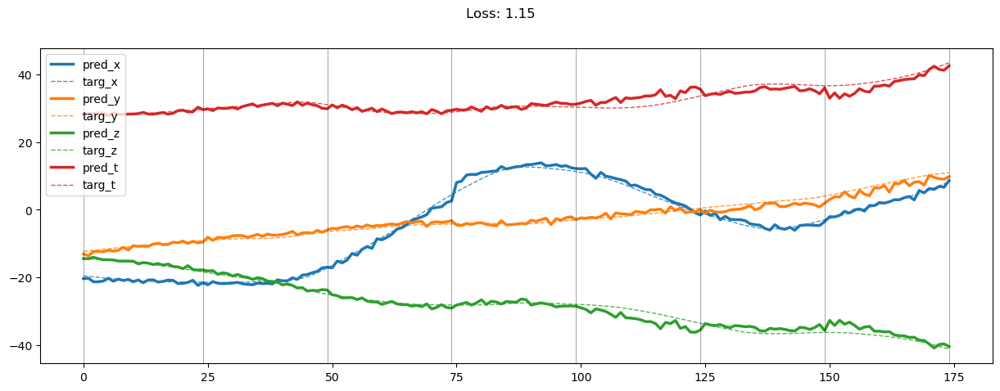

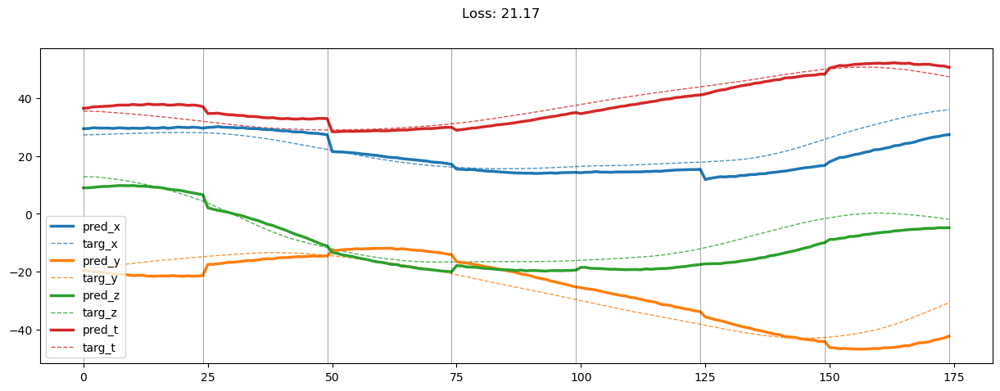

01200: train loss:  6.717, imu loss:  0.647, mag loss:  1.427, div loss:  2.837, slim:  4.358, tlim:  0.934
       valid loss:  145.036, imu loss:  0.519, mag loss:  60.356, div loss:  77.779, slim:  5.727, tlim:  5.237
01220: train loss:  6.673, imu loss:  0.647, mag loss:  1.410, div loss:  2.812, slim:  4.384, tlim:  0.927
       valid loss:  143.901, imu loss:  0.519, mag loss:  60.343, div loss:  76.760, slim:  5.625, tlim:  5.153
01240: train loss:  6.679, imu loss:  0.649, mag loss:  1.412, div loss:  2.822, slim:  4.358, tlim:  0.923
       valid loss:  143.373, imu loss:  0.519, mag loss:  59.696, div loss:  76.898, slim:  5.598, tlim:  5.140
01260: train loss:  6.603, imu loss:  0.648, mag loss:  1.392, div loss:  2.768, slim:  4.376, tlim:  0.919
       valid loss:  141.781, imu loss:  0.519, mag loss:  59.095, div loss:  75.957, slim:  5.575, tlim:  5.095
01280: train loss:  6.593, imu loss:  0.642, mag loss:  1.394, div loss:  2.768, slim:  4.357, tlim:  0.917
       valid

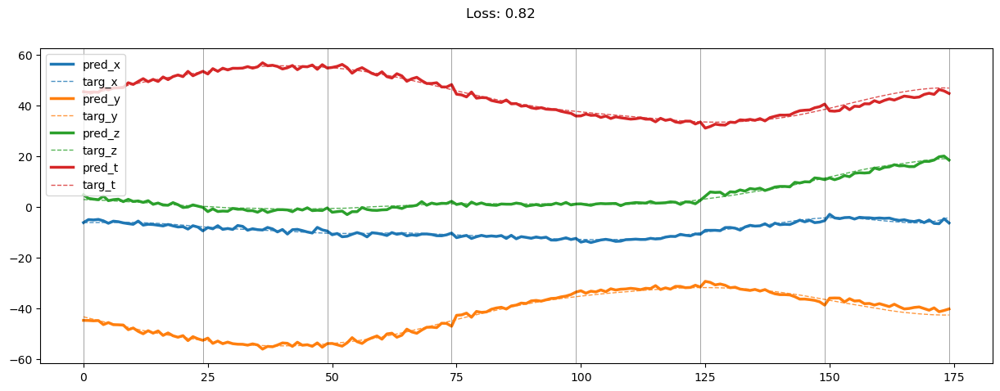

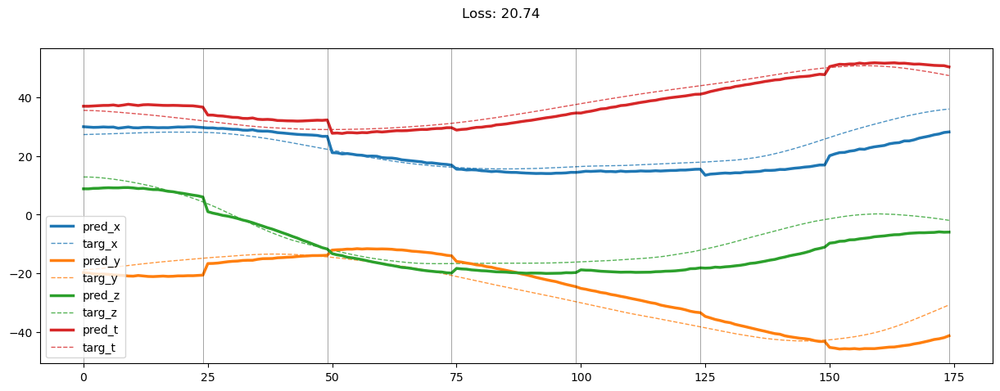

01400: train loss:  6.487, imu loss:  0.644, mag loss:  1.359, div loss:  2.706, slim:  4.364, tlim:  0.905
       valid loss:  144.076, imu loss:  0.521, mag loss:  59.670, div loss:  77.464, slim:  5.713, tlim:  5.279
01420: train loss:  6.439, imu loss:  0.640, mag loss:  1.346, div loss:  2.680, slim:  4.373, tlim:  0.898
       valid loss:  144.485, imu loss:  0.521, mag loss:  60.016, div loss:  77.587, slim:  5.658, tlim:  5.230
01440: train loss:  6.399, imu loss:  0.635, mag loss:  1.333, div loss:  2.665, slim:  4.350, tlim:  0.895
       valid loss:  143.293, imu loss:  0.521, mag loss:  59.628, div loss:  76.818, slim:  5.655, tlim:  5.195
01460: train loss:  6.432, imu loss:  0.634, mag loss:  1.345, div loss:  2.686, slim:  4.347, tlim:  0.899
       valid loss:  145.209, imu loss:  0.522, mag loss:  60.805, div loss:  77.566, slim:  5.640, tlim:  5.188
01480: train loss:  6.337, imu loss:  0.637, mag loss:  1.318, div loss:  2.626, slim:  4.344, tlim:  0.887
       valid

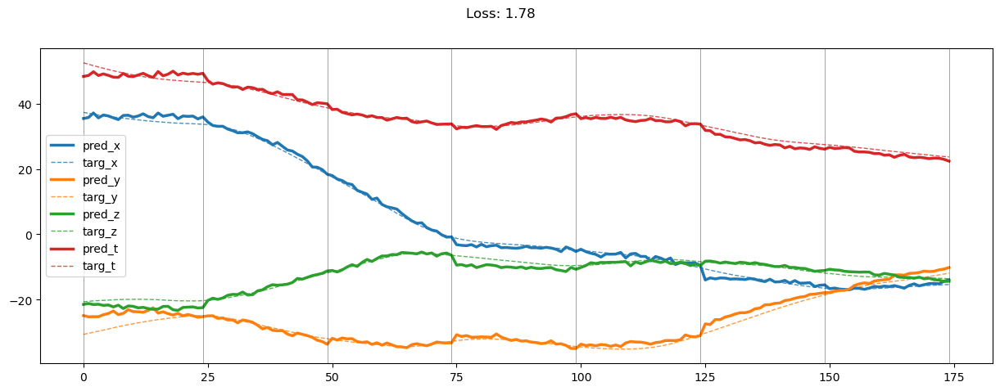

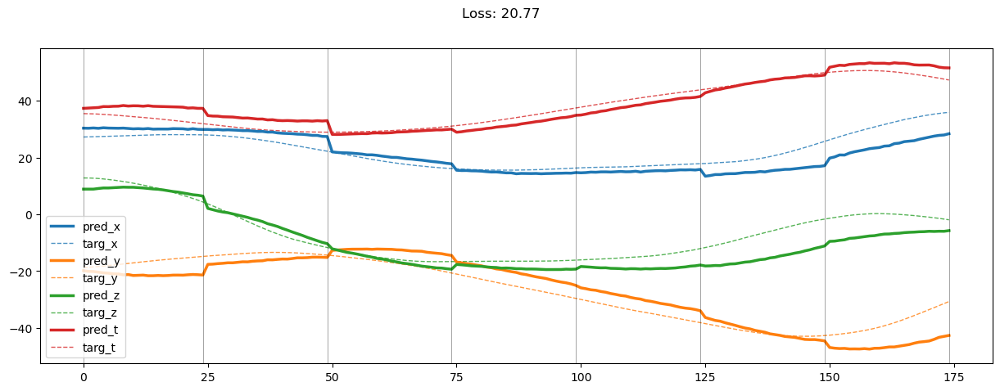

01600: train loss:  6.250, imu loss:  0.629, mag loss:  1.297, div loss:  2.573, slim:  4.354, tlim:  0.880
       valid loss:  148.194, imu loss:  0.523, mag loss:  61.508, div loss:  79.653, slim:  5.804, tlim:  5.349
01620: train loss:  6.228, imu loss:  0.637, mag loss:  1.283, div loss:  2.557, slim:  4.361, tlim:  0.879
       valid loss:  143.844, imu loss:  0.523, mag loss:  59.985, div loss:  76.892, slim:  5.729, tlim:  5.299
01640: train loss:  6.170, imu loss:  0.636, mag loss:  1.272, div loss:  2.532, slim:  4.312, tlim:  0.868
       valid loss:  145.927, imu loss:  0.523, mag loss:  61.061, div loss:  77.898, slim:  5.781, tlim:  5.289
01660: train loss:  6.175, imu loss:  0.632, mag loss:  1.269, div loss:  2.532, slim:  4.347, tlim:  0.872
       valid loss:  148.014, imu loss:  0.524, mag loss:  61.760, div loss:  79.250, slim:  5.787, tlim:  5.323
01680: train loss:  6.201, imu loss:  0.635, mag loss:  1.276, div loss:  2.542, slim:  4.387, tlim:  0.872
       valid

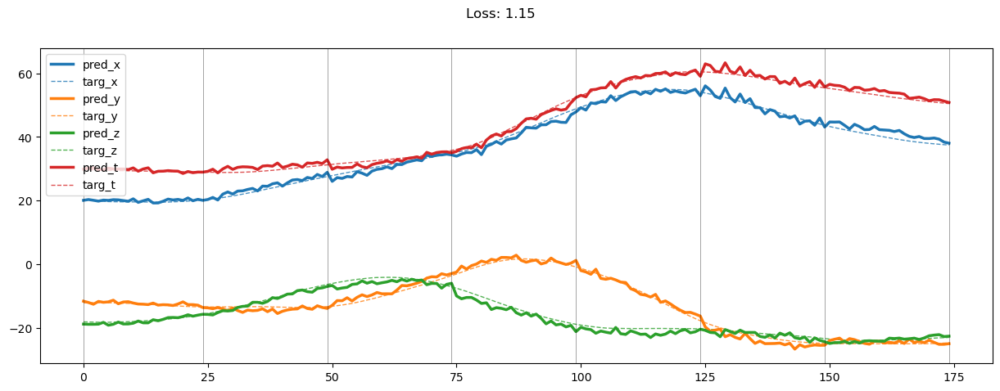

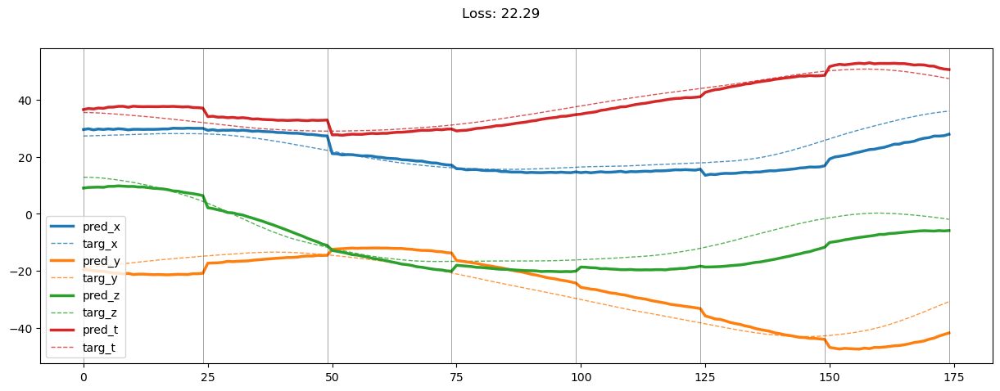

01800: train loss:  6.049, imu loss:  0.629, mag loss:  1.238, div loss:  2.457, slim:  4.326, tlim:  0.861
       valid loss:  150.129, imu loss:  0.524, mag loss:  62.202, div loss:  80.891, slim:  5.822, tlim:  5.347
01820: train loss:  6.086, imu loss:  0.627, mag loss:  1.246, div loss:  2.481, slim:  4.363, tlim:  0.859
       valid loss:  149.240, imu loss:  0.525, mag loss:  61.703, div loss:  80.393, slim:  5.847, tlim:  5.449
01840: train loss:  5.985, imu loss:  0.626, mag loss:  1.218, div loss:  2.425, slim:  4.343, tlim:  0.847
       valid loss:  149.816, imu loss:  0.525, mag loss:  62.383, div loss:  80.364, slim:  5.825, tlim:  5.380
01860: train loss:  5.998, imu loss:  0.622, mag loss:  1.225, div loss:  2.432, slim:  4.341, tlim:  0.851
       valid loss:  151.875, imu loss:  0.525, mag loss:  62.770, div loss:  82.043, slim:  5.844, tlim:  5.368
01880: train loss:  5.966, imu loss:  0.623, mag loss:  1.215, div loss:  2.417, slim:  4.328, tlim:  0.846
       valid

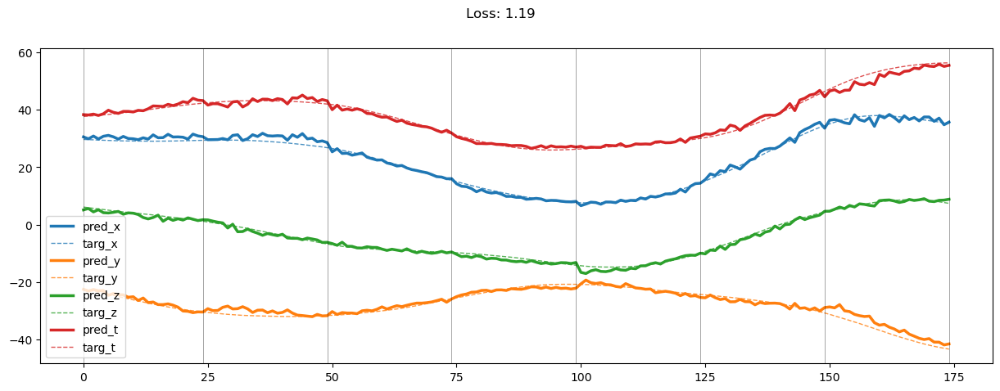

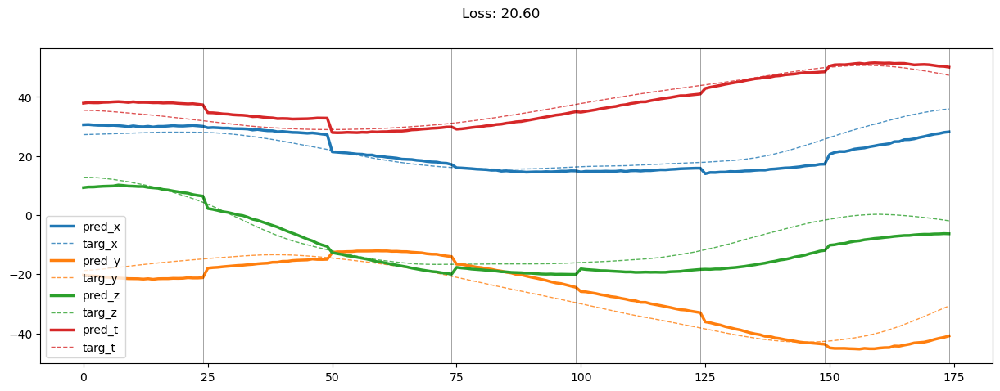

02000: train loss:  5.894, imu loss:  0.621, mag loss:  1.192, div loss:  2.376, slim:  4.343, tlim:  0.837
       valid loss:  150.284, imu loss:  0.527, mag loss:  62.618, div loss:  80.541, slim:  5.876, tlim:  5.422


In [30]:
draw = True

for epoch in range(EPOCH):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 200 == 0:
        draw = True
    
    train_loss, train_imu_loss, train_mag_loss, t_d1_loss, tlim_loss = train(train_loader, draw)
    valid_loss, valid_imu_loss, valid_mag_loss, v_d1_loss, vlim_loss = evalute(valid_loader, draw)
    
    draw = False
    
    if (epoch + 1) % 20 == 0:
        ep = str(epoch + 1).zfill(5)
        print(f'{ep:>5}: train loss: {train_loss: 2.3f}, imu loss: {train_imu_loss: 2.3f}, mag loss: {train_mag_loss: 2.3f}, div loss: {t_d1_loss: 2.3f}, slim: {tlim_loss[0]: 2.3f}, tlim: {tlim_loss[1]: 2.3f}\n' +
              f'{"":>5}  valid loss: {valid_loss: 2.3f}, imu loss: {valid_imu_loss: 2.3f}, mag loss: {valid_mag_loss: 2.3f}, div loss: {v_d1_loss: 2.3f}, slim: {vlim_loss[0]: 2.3f}, tlim: {vlim_loss[1]: 2.3f}')

In [25]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    class_results = []
    class_labels = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :, :6]
            source_mag = source_data[:, :, :, 6:9]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :, :6]
            target_mag = target_data[:, :, :, 6:9]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # generator loss
#             gen_loss, imu_loss, mag_loss = generator_loss(z_imu, target_imu, predict_mag, target_mag)

            # record loss
            predict_mag = predict_mag.detach().cpu().numpy()
            target_mag = target_mag.cpu().numpy()
            source_label = source_label.detach().cpu().numpy()
            
            results.extend(zip(predict_mag, target_mag, source_label))
            
            diff = np.power(predict_mag.reshape(len(predict_mag), -1, 3) - target_mag.reshape(len(target_mag), -1, 3), 2).mean(axis=1)
            class_results.extend(diff)
            class_labels.extend(source_label)
    
    return np.array(results, dtype=object), np.array(class_results), np.array(class_labels)

In [26]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    source_label = result[2]
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'{classes[source_label]}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

(5220, 3) (5220,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:     1.42     1.11     1.00     1.18
         pocket loss:     1.62     1.43     1.09     1.38
          swing loss:     1.62     1.74     1.20     1.52
        average loss:     1.55     1.42     1.09     1.35


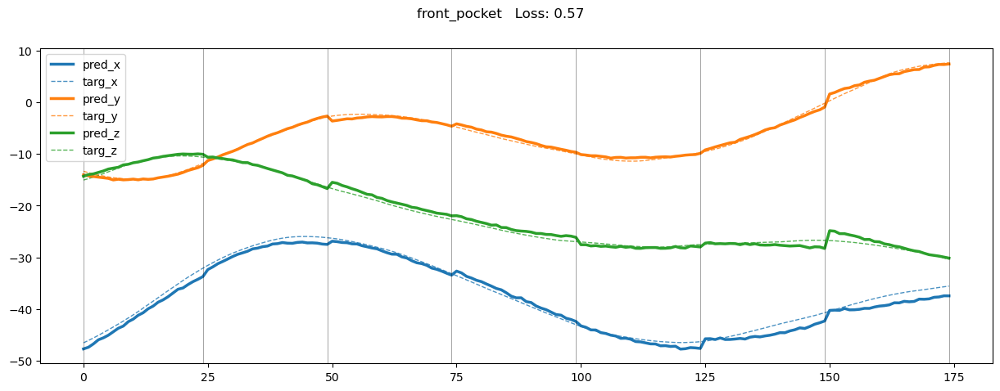

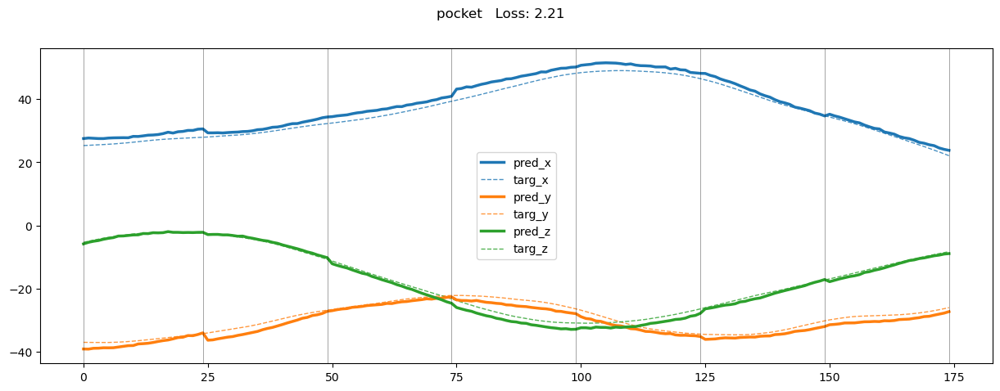

In [27]:
results, cres, clabel = output_eval(model, train_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dx, dy, dz = cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
dx, dy, dz = cres.mean(axis=0)
print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')

for rs in results[::5000]:
    plot_result(rs)

(180, 3) (180,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    16.36    22.31    24.06    20.91
         pocket loss:    69.31    99.79    49.22    72.77
          swing loss:    79.87    95.56    47.90    74.45
        average loss:    53.36    69.99    39.56    54.30


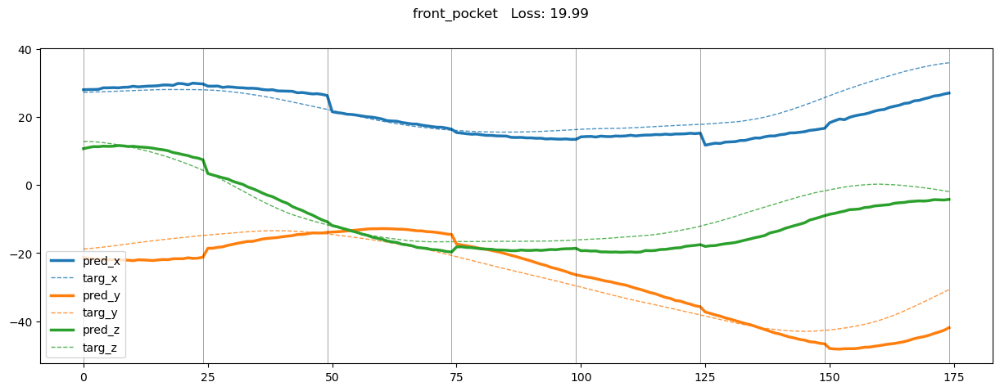

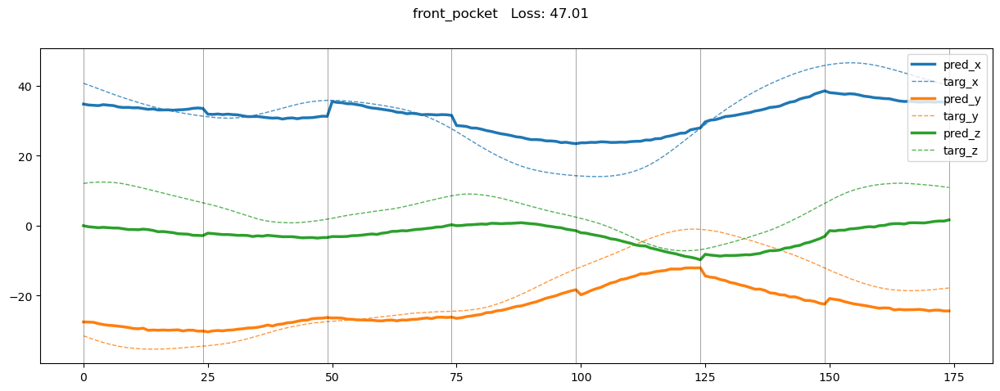

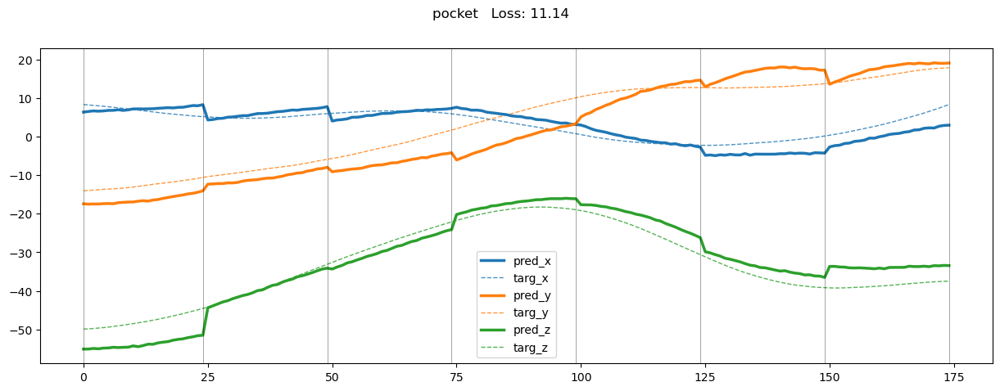

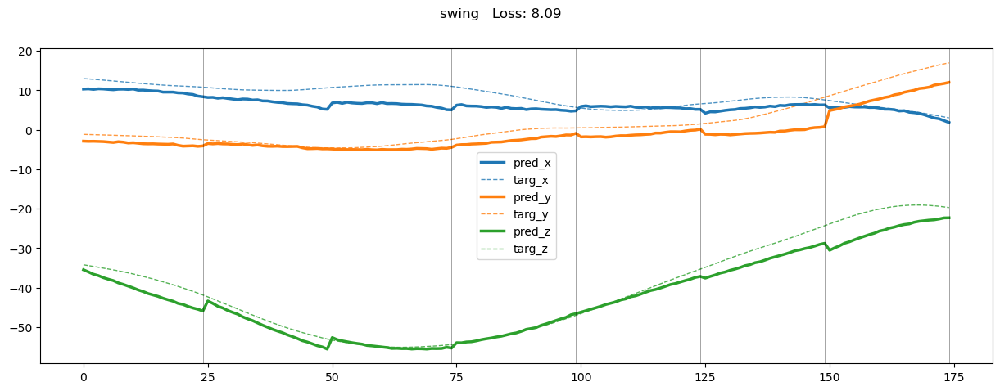

In [28]:
results, cres, clabel = output_eval(model, valid_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dx, dy, dz = cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
dx, dy, dz = cres.mean(axis=0)
print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')

for rs in results[::50]:
    plot_result(rs)

In [50]:
def plot_eval_result(result, path):
    pred_mag = np.stack(results[:, 0], axis=0)[:, 0, 0].reshape(-1, 3)
    targ_mag = np.stack(results[:, 1], axis=0)[:, 0, 0].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(25, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'{path}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [35]:
def load_data(folder_path):
    source_path = os.path.join(folder_path, 'source')
    target_path = os.path.join(folder_path, 'target')

    #########################
    ##### check devices #####
    #########################
    source_path, target_path = check_data_device(source_path, target_path)

    ####################################
    ##### load and preprocess data #####
    ####################################
    source_df = load_original_data(source_path)
    target_df = load_original_data(target_path)

    source_df, target_df = bound_range(source_df), bound_range(target_df)
    source_df, target_df = align_data(source_df, target_df)
    
    return select_data(source_df), select_data(target_df)

def split_data(df):
    total_length = chunk_size * seq_len
    
    segments = []
    for i in range(0, len(df) - total_length, 1):
        seg = df.iloc[i:i + total_length].to_numpy()
        segments.append(np.array(np.split(seg, chunk_size)))
    
    return np.array(segments)

def combine_to_dataloader(source, target):
    dataset = PairDataset(
                        source_data = torch.tensor(source, dtype=torch.float),
                        source_label = np.zeros(len(source)),
                        target_data = torch.tensor(target, dtype=torch.float),
                        target_label = np.zeros(len(target)),
                    )
    dataloader = DataLoader(dataset, batch_size=512, shuffle=False)
    
    return dataloader

def generate_dataloader(folder_path):
    source_df, target_df = load_data(folder_path)
    source_segs, target_segs = split_data(source_df), split_data(target_df)

    return combine_to_dataloader(source_segs, target_segs)

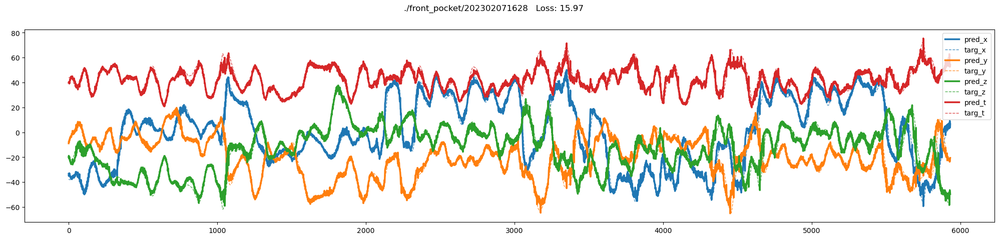

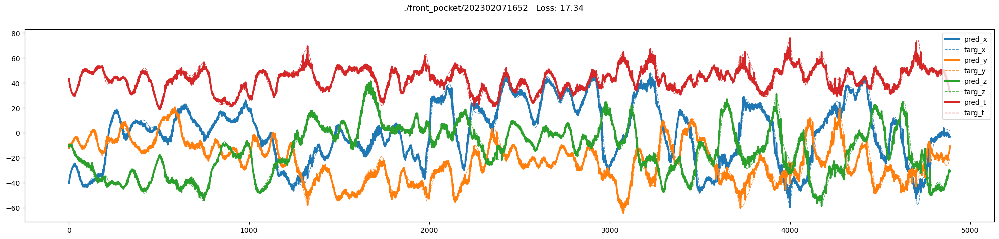

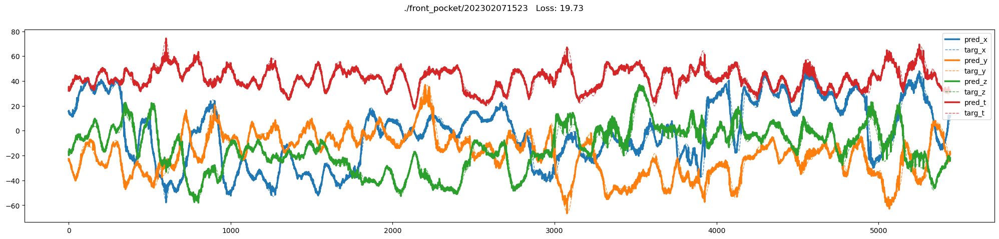

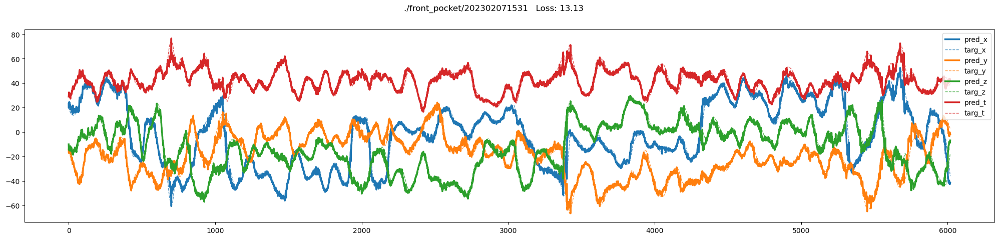

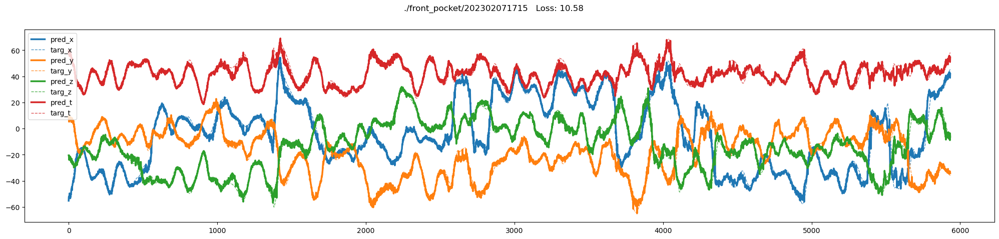

...

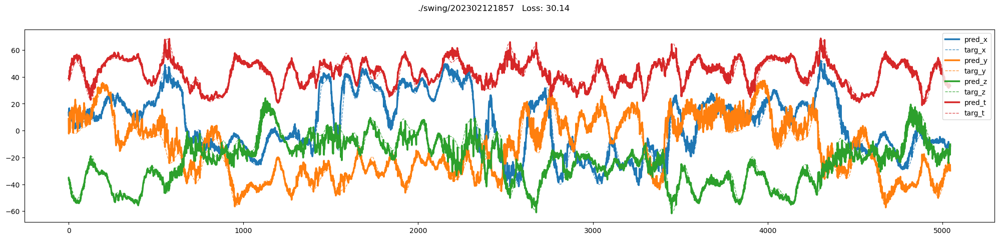

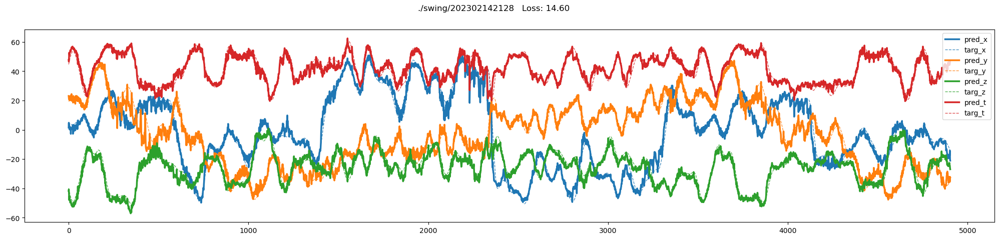

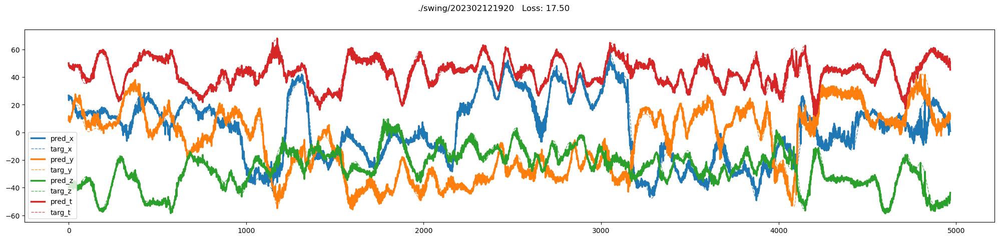

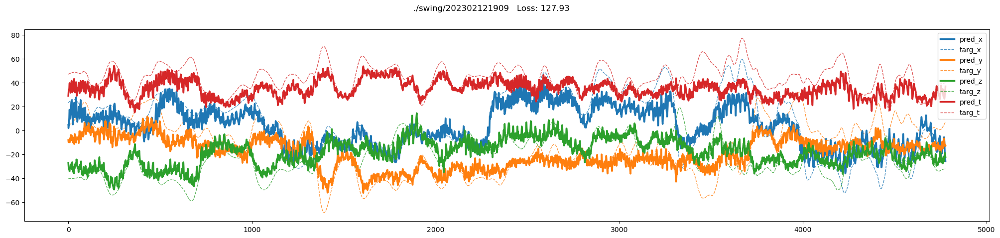

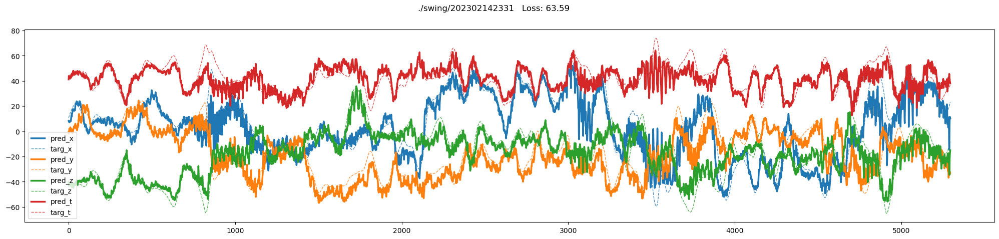

In [52]:
for folder in ['./front_pocket/*', './pocket/*', './swing/*']:
    for path in glob.glob(folder):
        eval_loader = generate_dataloader(path)
        results, _, _ = output_eval(model, eval_loader)
        plot_eval_result(results, path)